#PROJECT ON HOUSE PRICE PREDICTION

NAME = Poojan Vadaliya

ID : 1281587


#EXECUTIVE SUMMARY

**Data Analysis for Predicting the house prices**

In this data analysis project our aim would be to predict the house prices taken of the test dataset where AMES housing dataset has been considered which consists of data of 1000 houses which would help to build the model to make prediction on the test dataset.

**Description about DATA for the project**
* Considered Dataset : AMES housing dataset
* Target Feature : SalePrice


**Data Loading and Initial Inspection**

*   We initialised the train and test data from the given local dataset.
*   Combined the Train and Test data for initial data preprocessing which later on would be seperated.



**Missing Values and Exploratory Data Analysis**

*  Identified features with missing values and their type whether it is a temporal, numerical , categorical : ordinal or non-ordinal for the further handling.
*   Dropped the feature with major missing value. (i.e. PoolQC in our case which has almost more than 95% of data missing.)


**Data Engineering**

* Check how much the feature with less data is related to the target column, if we can drop them or not.
*  **Numerical Feature** : Features identified as numerical features were checked for the missing values which was then filled up by mean.
*  **Temporal Feature** : Features containing year were identified which were then checked against the target column to check the relationship of how its affecting the saleprice of the houses.
*  **Categorical Feature** :
Categories in categorical Features were turned into numerical values and the missing data points were filled up with median or mode depending on its nature.
 * Ordinal Categorical Features : After finding out the ordinal categories a set of numerical value was assigned to categories of each feature to find the relative strength of the value.

 * Non Ordinal Categorical Feature : The non ordinal features were encoded using getdummies where multiple new features were created as a result of encoding of categories.

* After finishing the cleaning and encoding part of the combined dataset the dataset has been seperated into train and test data as it was in the beginning to conduct experiment on modelling and further optimisation with the help of training data and test it on the test data.

**Modelling** :

For modelling and better results I have tried to use multiple model selection and feature optimisation techniques to find out the best model with the lowest RMSE score of the prediction dataset which includes :
  * Linear Regression
  * Ridge Regression
  * Feature selection using forward subset selection
  * Cross validation approach


**Underfitting Vs Overfitting**:

Underfitting vs overfitting was conveyed by changing the considered parameter for training the model to determine how the model is underfitting or overfitting the data at the time of prediction.

**Final Model**

Non other than the **Simple Linear Regression** was considered to be delivering the best results rather than considering any fancier regression technique or a special subset of features as a final model for the least rate of RMSE.




#Data Loading and Initial Inspection

Here we have loaded the train and test data from the Ames housing dataset and created a train and test dataframe which is then combined together in combined_data for the data pre-processing before the training of the model.

In [2]:
#Connecting the drive to this colab sheet
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Importing the required libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Machine Learning
from sklearn import preprocessing
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

# Error checking libraries
from sklearn.metrics import mean_squared_error



pd.pandas.set_option('display.max_columns',None) # To print out all the columns present in the dataframe

In [ ]:
#Loading the training and the testing dataset into individual dataframes
train_df = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/Housing_Data_Train.csv')
test_df = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/Housing_Data_Test .csv')

In [ ]:
#Dropping the columns of no use (i.e. : Unnamed column and Id)
train_df = train_df.drop(columns=[train_df.columns[0],'Id'],axis=1)
test_df = test_df.drop(columns=[test_df.columns[0],'Id'],axis=1)
dataset=train_df.copy()

Here we have concatenate the train and test data to clean and encode to numerical values which later on would be divided into to the encoded test and train dataset same as before but with encoded values and additional features after the data engineering is over.


In [ ]:
# Concatenate the two DataFrames vertically (along rows)
combined_data = pd.concat([train_df, test_df], axis=0)

# Reset the index of the combined DataFrame
combined_data.reset_index(drop=True, inplace=True)

<ipython-input-6-2a67a4edc4c7>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data.corr(),annot=True,cmap="YlGnBu")


<Axes: >

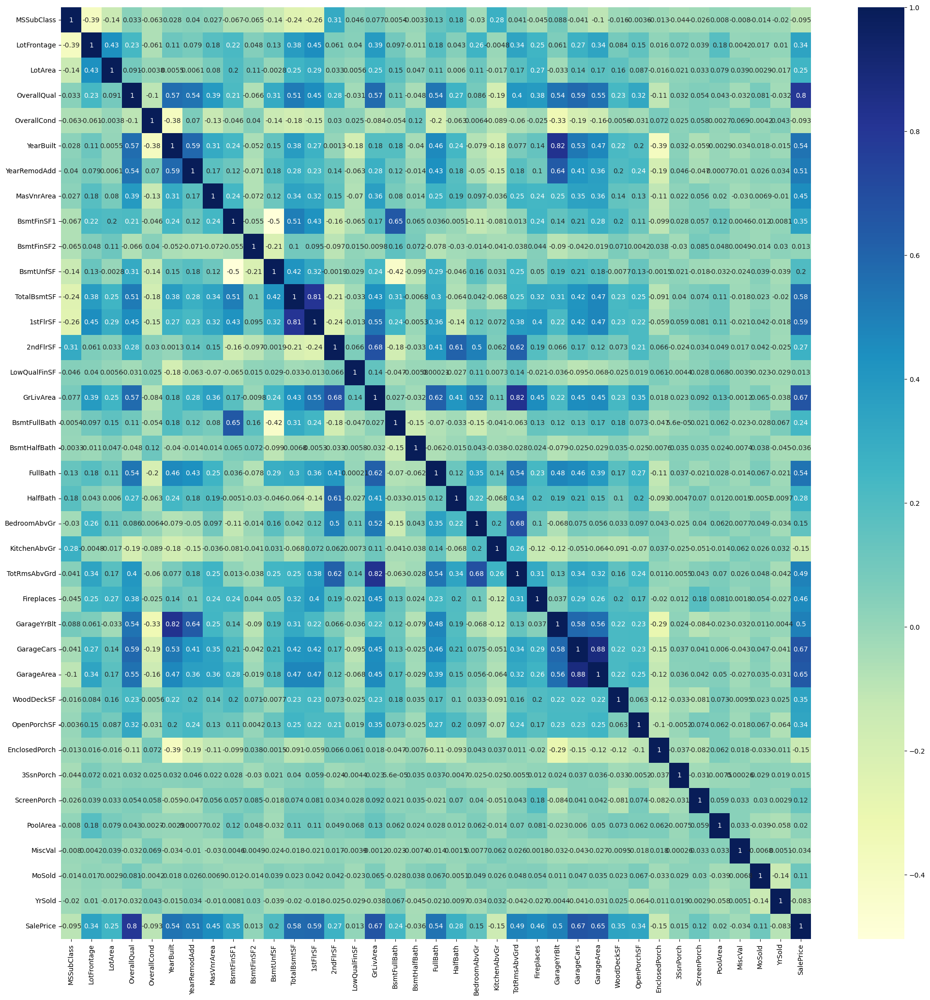

In [ ]:
#Heatmap for feature selection by checking out the correlation between the target and the predictor variables for dimensionality reduction.
plt.figure(figsize=(25,25))
sns.heatmap(combined_data.corr(),annot=True,cmap="YlGnBu")

In [ ]:
# 'Sales Price' is the target variable, and we want to find features with a correlation > 0.5
target_variable = 'SalePrice'
correlation_threshold = 0.4

# Compute the correlation matrix
correlation_matrix = combined_data.corr()

# Select the features with correlation > 0.5 or < -0.5 with the target variable
correlation_with_target = correlation_matrix[target_variable]
high_correlation_features = correlation_with_target[(correlation_with_target > correlation_threshold) | (correlation_with_target < -correlation_threshold)]

# Print or work with the high correlation features
high_correlation_features

<ipython-input-7-e1d5735d1ed5>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = combined_data.corr()


OverallQual     0.796024
YearBuilt       0.544929
YearRemodAdd    0.513484
MasVnrArea      0.452036
TotalBsmtSF     0.581164
1stFlrSF        0.587579
GrLivArea       0.665372
FullBath        0.542373
TotRmsAbvGrd    0.492748
Fireplaces      0.463582
GarageYrBlt     0.499288
GarageCars      0.668395
GarageArea      0.648286
SalePrice       1.000000
Name: SalePrice, dtype: float64

**CHECKIT UP AT END**


Analysing the Correlation between SalePrice and other variables in the dataset we can note the following observations
* OverallQual , is the most affecting (positively correlated) feature in the entire group affecting the saleprice of the house.
* GarageCars, GarageArea, GrLivArea, TotalBsmtSF, 1sttFlrSF were the features which almost seemed to be significantly effective in the contribution of sales price relationship as they are highly correlated with the target variable.

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


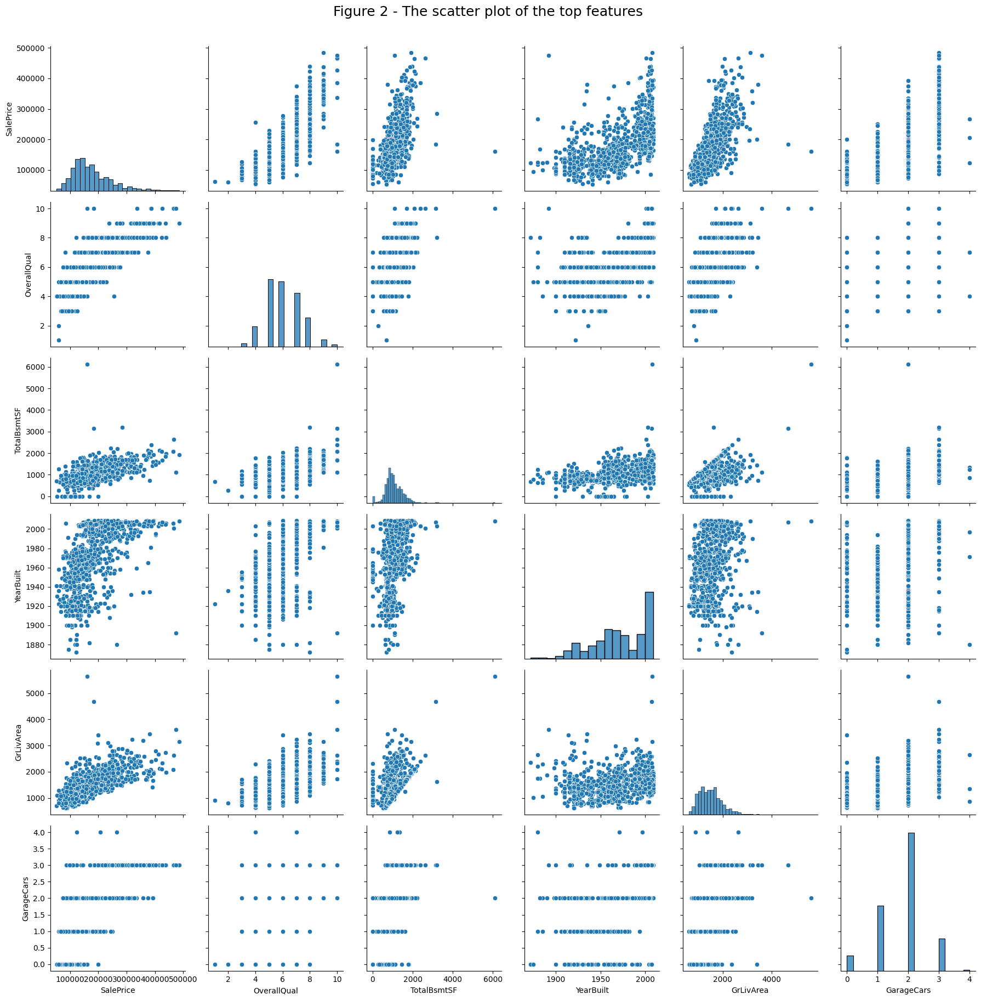

In [ ]:
#Scatter plot of thr most important features
cols = ['SalePrice', 'OverallQual', 'TotalBsmtSF', 'YearBuilt', 'GrLivArea', 'GarageCars']
sns.pairplot(dataset[cols], size = 3.0)
plt.suptitle('Figure 2 - The scatter plot of the top features ',x=0.5, y=1.01, verticalalignment='top', fontsize= 18)
plt.tight_layout()
plt.show();

Now Lets check the features with the missing values for the further procedure of whether to drop or impute the column for the further procedure.

In [ ]:
#Finding out the columns with missing values
cols_with_missing = [col for col in combined_data.columns
                                 if combined_data[col].isnull().any()]

print ('Number of columns with missing values :', len(cols_with_missing)-1) # subtracting 1 as we dont want saleprice as it is the target feature
print('which are :',cols_with_missing)


Number of columns with missing values : 19
which are : ['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature', 'SalePrice']


#Data Engineering

Filling up the missing values as well as encoding the data

In [ ]:
#Constructs a bargraph showing the approximate fraction of missing values in the dataset
def features_with_missing_value(df):
  #Here we got the fraction of the missing values in individual column
  feature_nan = df.isna().sum() / df.shape[0]
  feature_nan = feature_nan[feature_nan > 0.0]
  feature_nan = feature_nan.sort_values(ascending=False)

  sns.set_style("whitegrid")
  plt.figure(figsize=(10, 6))
  sns.set(font_scale=1.4)

  # Create a horizontal bar plot
  plt.barh(feature_nan.index, feature_nan.values, color='skyblue', edgecolor='gray')

  # Add labels and a title
  plt.xlabel("Fraction of Missing Values")
  plt.ylabel("Features")
  plt.title("Features with Missing Values")
  plt.gca().invert_yaxis()
  plt.show()


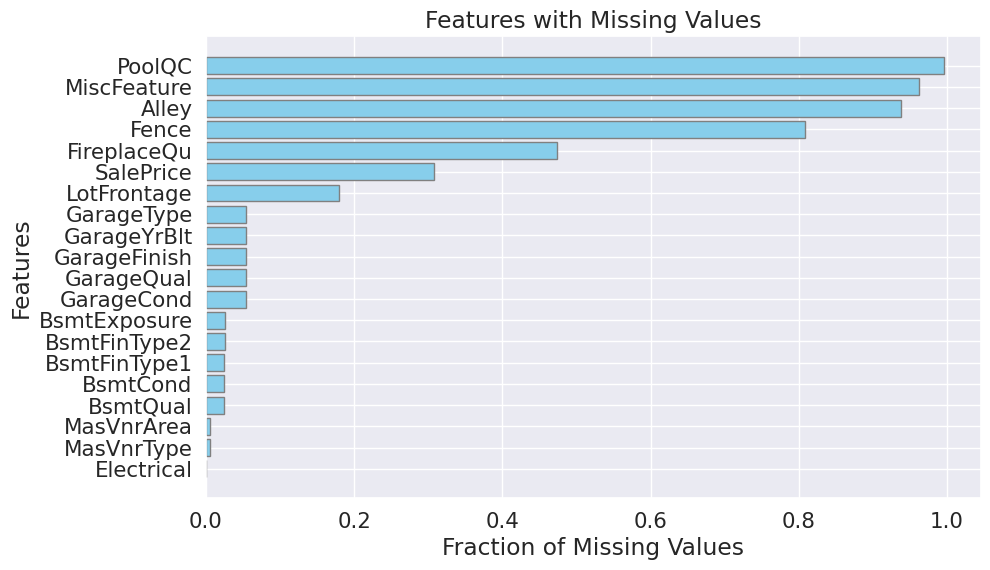

In [ ]:
#Here we got the fraction of the missing values in individual column
df=combined_data.copy()
features_with_missing_value(df)

In [ ]:
#Dropping the PoolQC as majority of the values are missing in the feaeture.
df = df.drop(columns=['PoolQC'])

In [ ]:
# Find columns with the same value in all rows
columns_with_same_value = df.columns[df.nunique() == 1]

# Display the columns with the same value
print("Features with the same value in all rows:")
print(columns_with_same_value)

print('Turns out, all features have a more than 1 unique element')

Features with the same value in all rows:
Index([], dtype='object')
Turns out, all features have a more than 1 unique element


In [ ]:
# Select the column "ColumnName" and retrieve non-null values
columns_to_replace_nan = ['MiscFeature', 'Alley', 'Fence', 'GarageType', 'GarageFinish', 'GarageCond', 'BsmtExposure', 'BsmtFinType2', 'BsmtFinType1']

print ('[Categories in columns]:', 'Number of values present in the column')
for column in columns_to_replace_nan:
  non_null_values = df[column][df[column].notnull()]

  # Print or work with non-null values
  print(column,':: ',non_null_values.unique(),",",non_null_values.count(),"values present")

[Categories in columns]: Number of values present in the column
MiscFeature ::  ['Shed' 'Gar2' 'Othr' 'TenC'] , 54 values present
Alley ::  ['Grvl' 'Pave'] , 90 values present
Fence ::  ['GdWo' 'GdPrv' 'MnPrv' 'MnWw'] , 277 values present
GarageType ::  ['Detchd' 'Attchd' 'BuiltIn' 'Basment' '2Types' 'CarPort'] , 1368 values present
GarageFinish ::  ['Unf' 'RFn' 'Fin'] , 1368 values present
GarageCond ::  ['TA' 'Fa' 'Gd' 'Po' 'Ex'] , 1368 values present
BsmtExposure ::  ['No' 'Gd' 'Av' 'Mn'] , 1409 values present
BsmtFinType2 ::  ['Unf' 'Rec' 'GLQ' 'LwQ' 'BLQ' 'ALQ'] , 1409 values present
BsmtFinType1 ::  ['GLQ' 'LwQ' 'ALQ' 'Unf' 'BLQ' 'Rec'] , 1410 values present


As MiscFeature and Alley are having number of values below 100 so lets check about there correaltion with the target variable.
As they are playing a critical role so we would not be eliminating them and hence would change the null values to 'missing'.

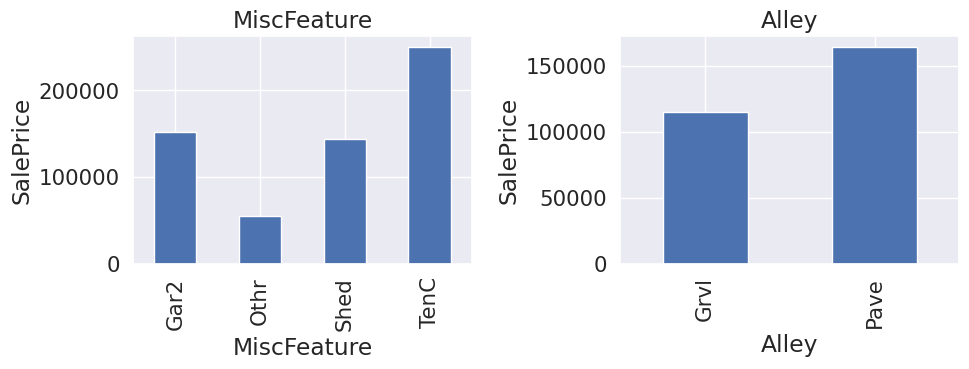

In [ ]:
## Lets Find the realtionship between them and Sale PRice
features = ['MiscFeature','Alley']
data=combined_data.copy()

plt.figure(figsize=(10, 4))  # Adjust the figure size as needed

plt.subplot(1,2,1)
data=combined_data.copy()
data.groupby('MiscFeature')['SalePrice'].median().plot.bar()
plt.xlabel('MiscFeature')
plt.ylabel('SalePrice')
plt.title('MiscFeature')
# plt.show()

plt.subplot(1,2,2)
data=combined_data.copy()
data.groupby('Alley')['SalePrice'].median().plot.bar()
plt.xlabel('Alley')
plt.ylabel('SalePrice')
plt.title('Alley')

# Adjust spacing between subplots
plt.subplots_adjust(wspace=1.4)  # Adjust the value to control horizontal spacing
plt.tight_layout()
plt.show()



* We can observe that both the features are significantly contributing for the relationship to the target variable , so we can consider to keep them.

* Also in the next code we are not droping the rows with missing columns rather are imputing with 'Nan' as the columns signify a missing element from the house which can be considered as a valuable one to affect the price.

In [ ]:
# Select the column "ColumnName" and retrieve non-null values
columns_to_replace_nan = ['MiscFeature', 'Alley', 'Fence', 'GarageType', 'GarageFinish', 'GarageCond', 'BsmtExposure', 'BsmtFinType2', 'BsmtFinType1']

# Replace NaN values with a string (e.g., 'NaN') in the specified columns
df[columns_to_replace_nan] = df[columns_to_replace_nan].fillna('NaN')

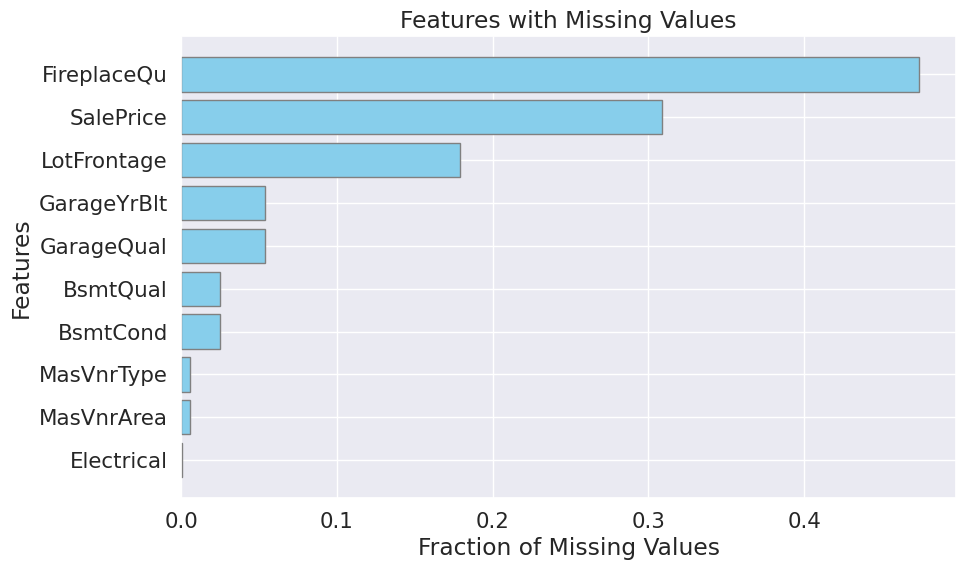

In [ ]:
#Keeping a check of how many features are still containing missing values
features_with_missing_value(df)

Identifying the type of the Feature for the imputation of the missing value.
* FirePlaceQu : Ordinal
* LotFrontage : Mean/Med
* GarageYrBuilt : Temporal
* GarageQual : Ordinal
* BSMTQual : Ordinal
* MasVnrType : Non Scalable Categorical Dat
* MasVnrArea : Mean
* Electrical : Scalable Cat Data

Note : Ignore the sale price here as it is due to the combined test data.

Encoding the Scalable categorical data for transformation from categorical to numerical values.
Giving the nominal categories values for encoding the categories in to the numerical feature.

In [ ]:
#Mapping the ordinal values - From Data 6200
ordinal_mapping = {
    'Reg': 1,
    'IR1': 2,
    'IR2': 3,
    'IR3': 4,
    'NaN': 0,

    'Ex': 5,
    'Gd': 4,
    'TA': 3,
    'Fa': 2,
    'Po': 1,

    'Gd': 4,
    'Av': 3,
    'Mn': 2,
    'No': 1,

    'GLQ': 6,  # Good Living Quarters
    'ALQ': 5,  # Average Living Quarters
    'BLQ': 4,  # Below Average Living Quarters
    'Rec': 3,  # Average Rec Room
    'LwQ': 2,  # Low Quality
    'Unf': 1,  # Unfinished

    'Typ': 7,   # Typical Functionality
    'Min1': 6,  # Minor Deductions 1
    'Min2': 5,  # Minor Deductions 2
    'Mod': 4,   # Moderate Deductions
    'Maj1': 3,  # Major Deductions 1
    'Maj2': 2,  # Major Deductions 2
    'Sev': 1,   # Severely Damaged
    'Sal': 0,   # Salvage only

    'Fin': 3,  # Finished
    'RFn': 2,  # Rough Finished
    'Unf': 1,  # Unfinished

    'GdPrv': 4,  # Good Privacy
    'MnPrv': 3,  # Minimum Privacy
    'GdWo': 2,   # Good Wood
    'MnWw': 1,   # Minimum Wood/Wire

    'Gtl': 3,
    'Mod': 2,
    'Sev': 1
}


In [ ]:
# df2 = df.copy()
# As the following features seems to have ordinal relationship between the categories so applying ordinal mapping would be a good idea to them.
# List of columns to apply ordinal mapping to for the conversion of categorical to numerical value
columns_to_map = ['LotShape', 'LandSlope', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
                  'KitchenQual', 'Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'Fence']

# Function to apply ordinal mapping to a column
def apply_ordinal_mapping(column, mapping):
    return column.map(mapping)

# Apply ordinal mapping to selected columns
for column in columns_to_map:
    df[column] = apply_ordinal_mapping(df[column], ordinal_mapping)

df[columns_to_map] = df[columns_to_map].fillna(0)

In [ ]:
#Backing up the current data for future modification
backup_data = df.copy()

In [ ]:
# Finding out features having categorical values
categorical_features=[feature for feature in df.columns if df[feature].dtype=='O']

# Perform one-hot encoding for categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_features, drop_first=True)

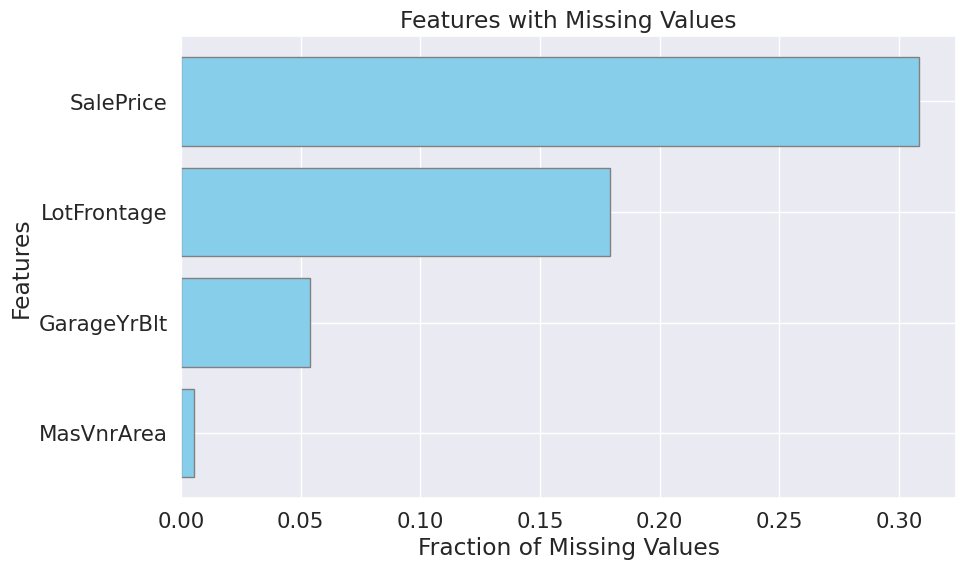

In [ ]:
#Copying the encoded data into the df variable
df = df_encoded

features_with_missing_value(df)

In [ ]:
#Filling up the empty values for the remaining categorical dataset
mode = df['MasVnrType'].mode()[0]
df['MasVnrType'].fillna(mode, inplace=True)

In [ ]:
#Numerical Features
Numerical_features_with_miss_val = ['LotFrontage','MasVnrArea']

#Filling up the missing values for the numerical features - GPT
for feature in Numerical_features_with_miss_val:
  mean_value = df[feature].mean()
  df[feature].fillna(mean_value, inplace=True)

#Scalable Categorical Feature
Scalable_cat_with_miss_val = ['Electrical']

#Filling up the missing values with mode due to lower number of missing values - GPT
for feature in Scalable_cat_with_miss_val:
  mode_value = df[feature].mode().iloc[0]
  df[feature].fillna(mode_value, inplace=True)


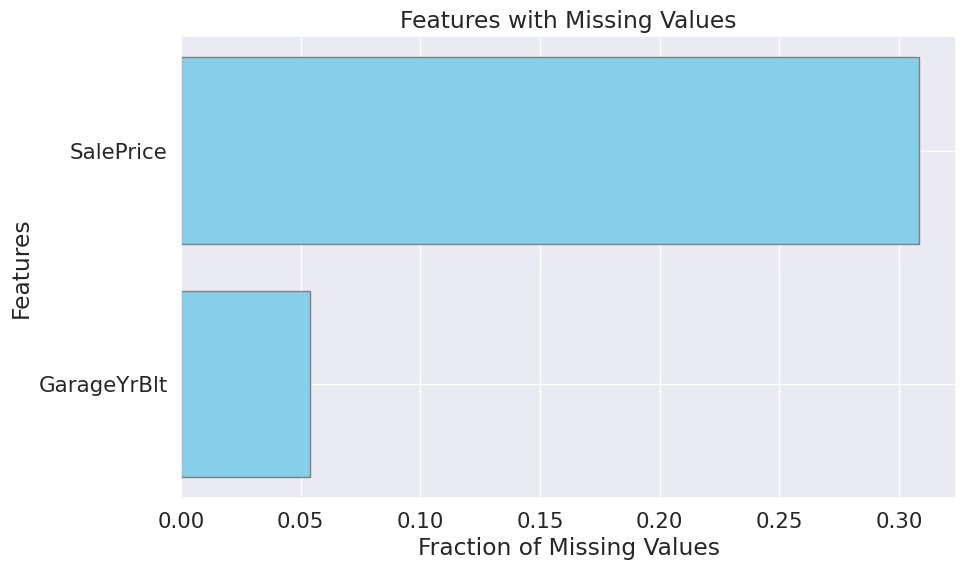

In [ ]:
features_with_missing_value(df)

Now manipulating the temporal data in a more normalised manner by finding out the difference between the year present when the house was built, remodeled or the garage was added and the Year in which the house was sold.


In [ ]:
#Manipulating year to number of years
for feature in ['YearBuilt','YearRemodAdd','GarageYrBlt']:
    df[feature]=df['YrSold']-df[feature]

In [ ]:
#Filling up the missing temporal data values
mean_value = df['GarageYrBlt'].mean()
df['GarageYrBlt'].fillna(mean_value, inplace=True)

In [ ]:
#Saving the data as backup
# df.to_csv('/content/drive/MyDrive/UofG/Data 6100/combinded_data.csv')

In [ ]:
#Seperating the train and test dataset from the conbined dataframe.
train_df_en = df[df['SalePrice'].notnull()]  # Rows with 'SalePrice' which is of train_df
test_df_en = df[df['SalePrice'].isnull()]  # Rows without 'SalePrice' which is of test_df

In [ ]:
#Save the encoded train and test dataset.
train_df_en.to_csv('/content/drive/MyDrive/UofG/Data 6100/train_en_data.csv')
test_df_en.to_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')

#Applying Linear Regression


Considering the heatmap above we can see that each and every feature in the dataset is having displays a linear relationship between the independent feature and the target feature which is SalePrice in our case.

Hence lets check how a linear regression model helps in predicting the data

In [ ]:
train_df_en=pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/train_en_data.csv')
train_df_en=train_df_en.drop(columns=[train_df_en.columns[0]],axis=1)
train_df_en

,MSSubClass,LotFrontage,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NaN,Alley_Pave,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NaN,PavedDrive_P,PavedDrive_Y,MiscFeature_NaN,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,20,63.000000,7500,1,3,7,5,4,3,120.0,3,3,4.0,3.0,1,6,680,1,0,400,1080,5,1080,0,0,1080,1,0,1,0,3,1,4,6,7,0,0.0,29.409357,0,0,0,0.0,0,0,0,0,0,0,0,0,0,4,2008,141000.0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,50,69.908172,7015,2,3,5,4,59,59,161.0,3,3,3.0,3.0,1,2,185,1,0,524,709,3,979,224,0,1203,1,0,1,0,3,1,4,5,7,1,3.0,59.000000,1,1,352,3.0,3,0,0,248,0,0,0,0,0,7,2009,110000.0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,

In [ ]:
from sklearn.model_selection import train_test_split

X = train_df_en.drop('SalePrice', axis=1)  # Features
y = train_df_en['SalePrice']  # Target variable

# Split the data into training and testing sets (e.g., 99% train, % test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.0001, random_state=42)


In [ ]:
# Train your model
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

# Evaluate your model
y_pred = model.predict(X_test)


In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(rmse)

19188.833877432684


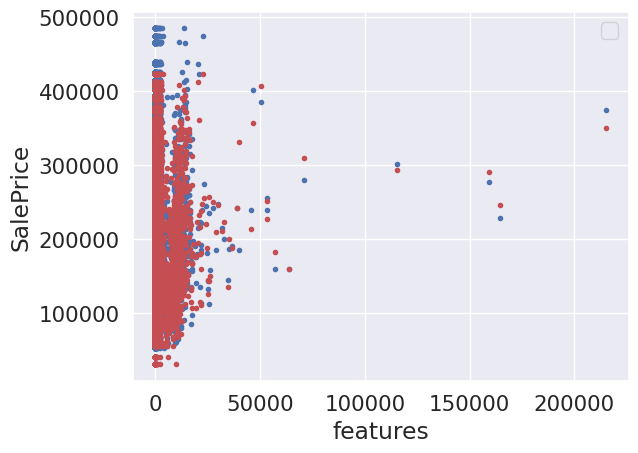

In [ ]:
plt.xlabel("LotArea")
plt.ylabel("SalePrice")
predictions = model.predict(X)
plt.plot(X,y,'b.')
plt.plot(X,predictions,'r.')
plt.legend()

In [ ]:
test_df = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')
test_df = test_df.drop(columns=[test_df.columns[0],'SalePrice'],axis=1)
test_df.head()

,MSSubClass,LotFrontage,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NaN,Alley_Pave,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NaN,PavedDrive_P,PavedDrive_Y,MiscFeature_NaN,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,20,80.0,9600,1,3,6,8,31,31,0.0,3,3,4.0,3.0,4,5,978,1,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,7,1,3.0,31.0,2,2,460,3.0,3,298,0,0,0,0,0,0,0,5,2007,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,50,51.0,6120,1,3,7,5,77,58,0.0,3,3,3.0,3.0,1,1,0,1,0,952,952,4,1022,752,0,1774,0,0,2,0,2,2,3,8,6,2,3.0,77.0,1,2,468,2.0,3,90,0,205,0,0,0,0,0,4,2008,0,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,

In [ ]:
#Load the test Data
test_df = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')
test_df = test_df.drop(columns=[test_df.columns[0],'SalePrice'],axis=1)

#Assing the data for prediction
X = test_df
predictions = model.predict(X)

#convert the predictions to a LIST of POSITIVE INTEGERS (do not submit decimals!)
list_predictions = predictions.tolist()
rounded_list_predictions = [int(x) for x in list_predictions]
print(rounded_list_predictions)

[210386, 151971, 124530, 130032, 133236, 270471, 77026, 192395, 147561, 157664, 148564, 282903, 263075, 164950, 163927, 411878, 117731, 166984, 224302, 60697, 109769, 186603, 161457, 189458, 130704, 110956, 192828, 179190, 182822, 117416, 133029, 148323, 320559, 254269, 168544, 167406, 125410, 148434, 219732, 211471, 159991, 169792, 201619, 114015, 116366, 103233, 133046, 224877, 287537, 182119, 289672, 155183, 144187, 200436, 164962, 187466, 115106, 194245, 125148, 142000, 104904, 94979, 148338, 126654, 218446, 241641, 190688, 224241, 282566, 93933, 232305, 253143, 80828, 242122, 197365, 212844, 113746, 190641, 127768, 161929, 142486, 179765, 229917, 255549, 124060, 267768, 249705, 137318, 284109, 167663, 158775, 185756, 344113, 153229, 133074, 77469, 115925, 210592, 153346, 70090, 206395, 156376, 315288, 164696, 123296, 103428, 199013, 139422, 263987, 345823, 217522, 212631, 78762, 153942, 103513, 142115, 146370, 218926, 268219, 290024, 248975, 220477, 313801, 139434, 107892, 212208,

Just by encoding and without any feature selection we get the following test rmse score for the prediction by simple linear regression.

Test RMSE Score : 23483

#Ridge Regression

Ridge regression is a model tuning method that is used to analyse any data that suffers from multicollinearity.
* This method performs L2 regularization. When the issue of multicollinearity occurs, least-squares are unbiased, and variances are large, this results in predicted values being far away from the actual values.

The cost function for ridge regression:

    Min(||Y – X(theta)||^2 + λ||theta||^2)

Lambda is the penalty term. λ given here is denoted by an alpha parameter in the ridge function. So, by changing the values of alpha, we are controlling the penalty term. The higher the values of alpha, the bigger is the penalty and therefore the magnitude of coefficients is reduced.
* It shrinks the parameters. Therefore, it is used to prevent multicollinearity
* It reduces the model complexity by coefficient shrinkage

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score

# Load your dataset (replace 'data.csv' with your data file)
train_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/train_en_data.csv')
train_df_en = train_df_en.drop(columns=[train_df_en.columns[0]],axis=1)
data = train_df_en

# Assuming 'Price' is your target variable and other columns are features
X = data.drop('SalePrice', axis=1)
y = data['SalePrice']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.001, random_state=42)

# Initialize the Ridge regression model with a regularization strength (alpha)
alpha = 0.01  # You can adjust the alpha parameter
ridge = Ridge(alpha=alpha)

# Fit the model on the training data
ridge.fit(X_train, y_train)

# Predict house prices on the test data
y_pred = ridge.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print("Root Mean Squared Error for training:", rmse)

# # # Print the coefficients of the model
# coefficients = ridge.coef_
# print("Ridge Coefficients:", coefficients)


Root Mean Squared Error for training: 18805.2734427104


In [4]:
#Testing the trained model on the trained dataset.
test_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')
test_df_en = test_df_en.drop(columns=[test_df_en.columns[0],'SalePrice'],axis=1)
test_df_en
# test_df.head()

X = test_df_en
predictions = ridge.predict(X)

#convert the predictions to a LIST of POSITIVE INTEGERS (do not submit decimals!)
list_predictions = predictions.tolist()
rounded_list_predictions = [int(x) for x in list_predictions]
print(rounded_list_predictions)

[210750, 152893, 125940, 129096, 131751, 270553, 75256, 190104, 146411, 158765, 149747, 283408, 260478, 166295, 163853, 412378, 116389, 165245, 223585, 62916, 110138, 187365, 162371, 187828, 131401, 111321, 192865, 180086, 183427, 118505, 136604, 146394, 319241, 253774, 168808, 168039, 127452, 149044, 220080, 210401, 160654, 169892, 201295, 113386, 114299, 105135, 134138, 224322, 284593, 184070, 287654, 156599, 144099, 200207, 163600, 188376, 117479, 195256, 123409, 142391, 106500, 95598, 149918, 126999, 218268, 244373, 190970, 222057, 283070, 94612, 231615, 251175, 82353, 241684, 197638, 212924, 111638, 190654, 127786, 161788, 142455, 181350, 229630, 253236, 123711, 267120, 248922, 138059, 280913, 167823, 160184, 187174, 344646, 151773, 130736, 75956, 116401, 213101, 151353, 70594, 207636, 156503, 316676, 166802, 123193, 105125, 199853, 139771, 262115, 343851, 219189, 211674, 76741, 152325, 104207, 143255, 146347, 218681, 269741, 289571, 249825, 218174, 313463, 139485, 107848, 212471,

After considering various values of alpha in ridge regression we got the following results for the test RMSE:


|  Test No |  Alpha | RMSE |
|----------|----------|----------|
| 1| 0.0001   | 23472  |
| 2| 0.01   | 23371   |
| 3| 0.1   | 24059   |
| 4| 0.15   | 24206   |
| 5| 1.0   | 24441   |


Here from the above table of all the alpha values we can find out that 0.01 can be considered as the most optimum alpha among all as it is giving us the least rmse score.


#Forward Subset Selection

In [261]:
# Load your dataset (replace 'data.csv' with your data file)
train_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/train_en_data.csv')
train_df_en = train_df_en.drop(columns=[train_df_en.columns[0]],axis=1)
data = train_df_en

test_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')
test_df_en = test_df_en.drop(columns=[test_df_en.columns[0],'SalePrice'],axis=1)

X = train_df_en.drop('SalePrice', axis=1)  # Features
y = train_df_en['SalePrice']  # Target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.001, random_state=3)


In [262]:
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.linear_model import LinearRegression

In [263]:
lreg = LinearRegression()
sfs1 = sfs(lreg, k_features=20, forward=True, verbose=1, scoring='neg_mean_squared_error')
sfs1 = sfs1.fit(X, y)
feat_names = list(sfs1.k_feature_names_)
print(feat_names)

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    9.6s
Features: 1/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    4.1s
Features: 2/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    2.3s
Features: 3/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    2.3s
Features: 4/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.6s
Features: 5/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.8s
Features: 6/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.9s
Features: 7/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.6s
Features: 8/20[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.6s
Features: 9/20[Parallel(n_jobs=1)]

['MSSubClass', 'OverallQual', 'YearRemodAdd', 'BsmtExposure', 'BsmtFinType1', 'GrLivArea', 'KitchenQual', 'Fireplaces', 'GarageCars', 'LandContour_HLS', 'LotConfig_CulDSac', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Condition1_Norm', 'BldgType_2fmCon', 'RoofMatl_WdShngl', 'Exterior1st_BrkFace']


In [264]:
# creating a new dataframe using the above variables and adding the target variable
new_data = data[feat_names]
# new_data['SalePrice'] = y

# first five rows of the new data
new_data.head()

,MSSubClass,OverallQual,YearRemodAdd,BsmtExposure,BsmtFinType1,GrLivArea,KitchenQual,Fireplaces,GarageCars,LandContour_HLS,LotConfig_CulDSac,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Somerst,Neighborhood_StoneBr,Condition1_Norm,BldgType_2fmCon,RoofMatl_WdShngl,Exterior1st_BrkFace
0,20,7,3,1,6,1080,4,0,0,0,0,0,0,0,0,0,1,0,0,0
1,50,5,59,1,2,1203,4,1,1,0,0,0,0,0,0,0,1,0,0,0
2,20,6,32,1,5,1334,3,1,2,0,0,0,0,0,0,0,1,0,0,0
3,20,5,52,1,2,1128,3,0,1,0,0,0,0,0,0,0,1,0,0,0
4,60,8,1,4,1,2482,4,1,3,0,0,0,0,0,0,0,1,0,0,0


In [265]:

# Assuming 'Price' is your target variable and other columns are features
X = new_data
y = y

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.001, random_state=42)

# Initialize the Ridge regression model with a regularization strength (alpha)
alpha = 0.01  # You can adjust the alpha parameter
ridge = Ridge(alpha=alpha)

# Fit the model on the training data
ridge.fit(X_train, y_train)

# Predict house prices on the test data
y_pred = ridge.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print("Root Mean Squared Error for training:", rmse)


Root Mean Squared Error for training: 12306.311353899742


In [266]:
#Testing the trained model on the trained dataset.
test_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')
test_df_en = test_df_en.drop(columns=[test_df_en.columns[0],'SalePrice'],axis=1)
test_df_en
# test_df.head()

X = test_df_en[new_data.columns.tolist()]
predictions = ridge.predict(X)

#convert the predictions to a LIST of POSITIVE INTEGERS (do not submit decimals!)
list_predictions = predictions.tolist()
rounded_list_predictions = [int(x) for x in list_predictions]
print(rounded_list_predictions)

[178376, 185461, 97453, 151154, 155151, 281258, 51079, 202098, 135584, 154622, 142182, 283676, 242368, 180781, 169402, 388104, 128417, 162996, 215772, 55228, 126645, 184140, 168124, 191802, 127690, 138468, 190562, 170682, 179547, 121892, 101924, 159130, 288495, 204715, 169396, 189803, 118148, 145563, 218768, 210143, 163268, 175283, 189117, 130200, 150828, 118404, 112663, 239501, 267138, 171222, 268243, 159340, 107111, 237211, 182988, 198172, 121297, 201736, 162359, 128793, 101371, 149910, 144771, 156332, 206958, 225334, 180900, 197708, 296789, 98205, 198089, 252763, 103365, 232865, 161675, 211705, 106311, 209268, 115328, 157902, 139802, 194936, 231597, 232034, 118422, 233427, 251232, 132162, 263681, 183543, 185208, 197358, 333902, 144032, 175894, 109313, 136653, 211111, 134925, 77445, 199370, 141542, 299183, 166668, 117836, 101676, 205565, 151592, 261248, 325951, 211242, 206537, 96363, 148082, 86043, 140236, 141840, 215542, 273738, 281324, 242507, 199051, 313984, 167423, 98623, 191412,

RMSE Score : 27039

#Cross Validation

In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Load your dataset (replace 'data.csv' with your data file)
train_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/train_en_data.csv')
train_df_en = train_df_en.drop(columns=[train_df_en.columns[0]],axis=1)
data = train_df_en

test_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')
test_df_en = test_df_en.drop(columns=[test_df_en.columns[0],'SalePrice'],axis=1)

In [13]:
# Assuming 'Price' is your target variable and other columns are features
X = data.drop('SalePrice', axis=1)
y = data['SalePrice']

# Split the data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.01, random_state=42)

# Initialize your regression model (e.g., Linear Regression)
alpha = 0.01  # You can adjust the alpha parameter
model = Ridge(alpha=alpha)

# Perform k-fold cross-validation (e.g., 5-fold cross-validation)
cv_scores = cross_val_score(model, X_train, y_train, cv=10, scoring='neg_mean_squared_error')

# Convert the negative MSE scores to positive
mse_scores = -cv_scores

# Print the cross-validation MSE scores
print("Cross-Validation MSE Scores:", mse_scores)

# Fit the model on the entire training dataset
model.fit(X_train, y_train)

# Evaluate the model on the training dataset
y_train_pred = model.predict(X_train)

# Evaluate the model on the testing dataset
y_val_pred = model.predict(X_val)

# Calculate and print the test MSE
train_mse = mean_squared_error(y_train,y_train_pred)
test_mse = mean_squared_error(y_val, y_val_pred)


Cross-Validation MSE Scores: [5.37282427e+08 1.63857505e+09 1.64536395e+09 4.86624632e+08
 3.26115077e+09 7.33541886e+08 5.21004049e+08 4.76169625e+09
 4.82914354e+08 3.04016014e+09]


In [14]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

# Assuming you've made changes to hyperparameters and features
# ...
n_split=10

# Re-initialize KFold cross-validator
kf = KFold(n_splits= n_split , shuffle=True, random_state=42)

# Initialize lists to store performance metrics
rmse_scores = []

# Iterate through each fold
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Create and train the model with updated hyperparameters and features
    model = Ridge(alpha=alpha)  # Replace with your updated model
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Calculate RMSE for this fold
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Append the RMSE to the list of scores
    rmse_scores.append(rmse)

# Calculate the average RMSE across all folds with the updated model
average_rmse = np.mean(rmse_scores)

print(f'Average RMSE across {n_split} folds with updated model: {average_rmse}')


Average RMSE across 10 folds with updated model: 38158.89320922893


In [15]:
from sklearn.linear_model import LassoCV

# Define the number of folds (e.g., 5)
n_splits = 4

# Initialize KFold cross-validator
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize a LassoCV model with cross-validation
lasso_cv = LassoCV(alphas=np.logspace(-4, 4, 100), cv=n_splits)

# Initialize lists to store performance metrics
rmse_scores = []

# Iterate through each fold
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the LassoCV model with cross-validation
    lasso_cv.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = lasso_cv.predict(X_test)

    # Calculate RMSE for this fold
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Append the RMSE to the list of scores
    rmse_scores.append(rmse)

# Calculate the average RMSE across all folds with LassoCV
average_rmse = np.mean(rmse_scores)

print(f'Average RMSE with LassoCV across {n_splits} folds: {average_rmse}')

# Optimal alpha found by LassoCV
optimal_alpha = lasso_cv.alpha_
print(f'Optimal alpha: {optimal_alpha}')


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47475439851.53235, tolerance: 299981266.36376524
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45728440808.99448, tolerance: 299981266.36376524
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44056937892.69739, tolerance: 299981266.36376524
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: Convergence

Average RMSE with LassoCV across 4 folds: 30842.172652706584
Optimal alpha: 114.9756995397738


In [16]:
X = test_df_en
predictions = model.predict(X)

#convert the predictions to a LIST of POSITIVE INTEGERS (do not submit decimals!)
list_predictions = predictions.tolist()
rounded_list_predictions = [int(x) for x in list_predictions]
print(rounded_list_predictions)

[214944, 158067, 127370, 128351, 132651, 272748, 63113, 188440, 141974, 156563, 145587, 285902, 256616, 169213, 168018, 416888, 116321, 167980, 224420, 61617, 109248, 188005, 159320, 185774, 127893, 109870, 191425, 181841, 185506, 119765, 129185, 143910, 318166, 253882, 171868, 168000, 124503, 154053, 223698, 210668, 164078, 169545, 196745, 117689, 116210, 106423, 131346, 222204, 292842, 183805, 292863, 158280, 126330, 206820, 163059, 183630, 107527, 198833, 125786, 141000, 109678, 95471, 149322, 129490, 219823, 252861, 189145, 225485, 286399, 96085, 220662, 249392, 84499, 244276, 189873, 212692, 101300, 196005, 136840, 157871, 139694, 183448, 245288, 255282, 128215, 269045, 247450, 138537, 293207, 168067, 167644, 188627, 344207, 150899, 140158, 76737, 118665, 214783, 147523, 60647, 208738, 154885, 316499, 165128, 123959, 106155, 197784, 136475, 259071, 343198, 223695, 210859, 75267, 151262, 101918, 141272, 152315, 211983, 269703, 290849, 250533, 219115, 317548, 145234, 106211, 215965,

RMSE SCORE : 22891

#Overfitting and Underfitting Demonstration


##Underfitting Model

When enough features havent been considered for helping to find the underlying relationship in the data it may be considered to be underfitted model.

As explained down in our case that we have just considered a single feature LotArea to train the model which due to which the developed model is underfitted when plotted against the test data.

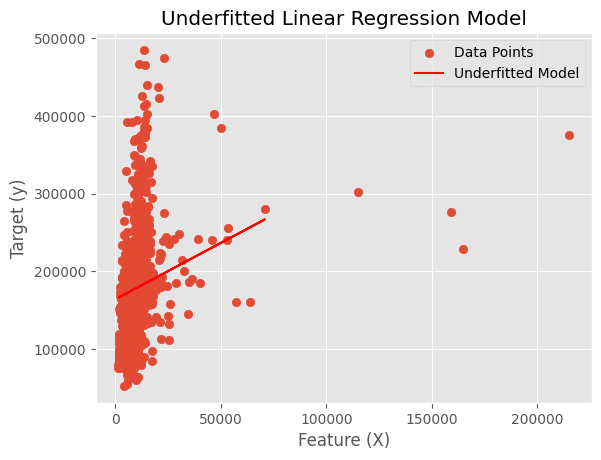

Mean Squared Error: 4385052040.32


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Assuming 'SalePrice' is your target variable and other columns are features
X = train_df_en[['LotArea']]
y = train_df_en['SalePrice']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create and fit a simple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Plot the data points and the linear regression model
plt.scatter(X, y, label="Data Points")
plt.plot(X_test, y_pred, color='red', label="Underfitted Model")
plt.xlabel("Feature (X)")
plt.ylabel("Target (y)")
plt.legend()
plt.title("Underfitted Linear Regression Model")
plt.show()

# Calculate the Mean Squared Error (MSE) to evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")


##Overfitting Model

When number of features and model evaluation parameters are exceeded to build a model at that time the model tries to fit every data point for the realting to train set but when checked for test set it shows a false prediction hence seems to be overfitted at that time.

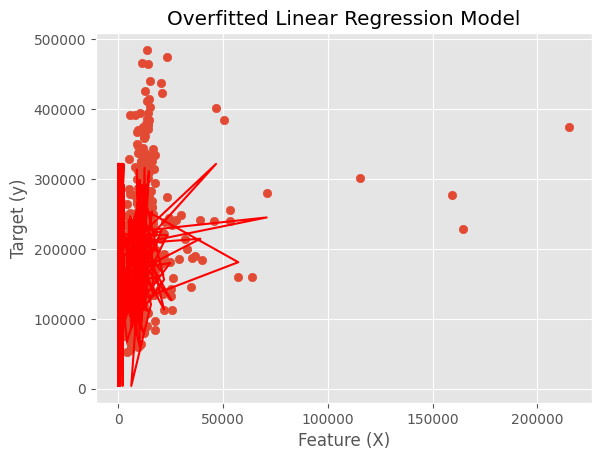

Mean Squared Error: 990573033.43


In [6]:
# Assuming 'SalePrice' is your target variable and other columns are features
X = train_df_en[['GrLivArea', '1stFlrSF', 'LotArea', 'BsmtUnfSF', 'TotalBsmtSF',
       'GarageArea', 'YearBuilt', 'LotFrontage', 'MoSold', 'GarageYrBlt',
       'YearRemodAdd', 'BsmtFinSF1', 'WoodDeckSF', 'OpenPorchSF',
       'TotRmsAbvGrd', 'MasVnrArea', 'YrSold', '2ndFlrSF', 'OverallQual',
       'BsmtFinType1']]
y = train_df_en['SalePrice']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create and fit a simple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Plot the data points and the linear regression model
plt.scatter(X['LotArea'], y, label="Data Points")
plt.plot(X_test, y_pred, color='red', label="Overfitted Model")
plt.xlabel("Feature (X)")
plt.ylabel("Target (y)")
plt.title("Overfitted Linear Regression Model")
plt.show()



# Calculate the Mean Squared Error (MSE) to evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")

## ROC Curve

Here let us see the effect of how the consideration of subset selection affects the prediction model ,of how it is underfitting and overfitting for the predicition set by overtraining nad undertraining the considered model.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

np.random.seed(0)
plt.style.use('ggplot')

# Load your house price prediction dataset into df
# Perform preprocessing and split the dataset into train and validation sets

# Load your dataset (replace 'data.csv' with your data file)
train_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/train_en_data.csv')
train_df_en = train_df_en.drop(columns=[train_df_en.columns[0]],axis=1)
train_df_en

test_df_en = pd.read_csv('/content/drive/MyDrive/UofG/Data 6100/test_en_data.csv')
test_df_en = test_df_en.drop(columns=[test_df_en.columns[0],'SalePrice'],axis=1)
test_df_en

# Assuming 'SalePrice' is your target variable and other columns are features
X = train_df_en.drop('SalePrice', axis=1)
y = train_df_en['SalePrice']



In [7]:
def processSubset(feature_set, X_train, y_train, X_test, y_test):
    # Fit model on feature_set and calculate RSS
    model = sm.OLS(y_train,X_train[list(feature_set)])
    regr = model.fit()
    RMSE = float(np.sqrt(np.mean((regr.predict(X_test[list(feature_set)]) - y_test) ** 2)))
    return {'p':len(feature_set),'features':feature_set, 'model':regr, 'RMSE':RMSE}

def forward(predictors, X_train, y_train, X_test, y_test):
    # Pull out predictors we still need to process
    remaining_predictors = [p for p in X_train.columns if p not in predictors]

    results = []

    for p in remaining_predictors:
        results.append(processSubset(predictors+[p], X_train, y_train, X_test, y_test))

    # Wrap everything up in a nice dataframe
    models = pd.DataFrame(results)

    for i in range(len(models)):
      print(f" Option #{i}: {models['features'][i]}")
      print(f" RMSE: {round(models['RMSE'][i],1)}")

    # Choose the model with the lowest RMSE
    best_model = models.loc[models['RMSE'].argmin()]

    # Return the best model, along with some other useful information about the model
    return best_model

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=3)

models = pd.DataFrame(columns=['p','RMSE','features','model'])

predictors = []

for i in range(1,len(X.columns)+1):
    models.loc[i] = forward(predictors, X_train, y_train, X_test, y_test)
    predictors = models.loc[i]['model'].model.exog_names

models['RMSE'] = models['RMSE'].astype(float)

Streaming output truncated to the last 5000 lines.
 Option #56: ['OverallQual', 'GarageCars', 'LandSlope', 'KitchenQual', 'Fireplaces', 'Neighborhood_NridgHt', 'BsmtFinSF1', 'Neighborhood_NoRidge', 'FullBath', 'MSSubClass', 'BsmtExposure', 'HalfBath', 'Neighborhood_Crawfor', 'WoodDeckSF', 'ScreenPorch', 'Exterior1st_BrkFace', 'BsmtFullBath', 'YearRemodAdd', 'PoolArea', 'Neighborhood_CollgCr', 'Neighborhood_Edwards', 'Exterior1st_HdBoard', 'LotArea', 'Exterior1st_Wd Sdng', 'Neighborhood_Gilbert', 'BldgType_Twnhs', 'Exterior1st_Plywood', 'Neighborhood_OldTown', 'BldgType_2fmCon', 'Neighborhood_NAmes', 'LotConfig_FR3', 'OverallCond', 'Condition1_RRAe', 'LotConfig_CulDSac', 'Neighborhood_Veenker', 'LotConfig_FR2', 'Exterior2nd_Wd Shng', 'MasVnrType_Stone', 'Heating_GasA', 'Exterior2nd_Stucco', 'TotRmsAbvGrd', 'Condition1_Feedr', 'Neighborhood_Somerst', 'LandContour_HLS', 'LandContour_Lvl', 'Neighborhood_ClearCr', 'Exterior2nd_CmentBd', 'Exterior1st_CemntBd', 'Neighborhood_Sawyer', 'Neighbo

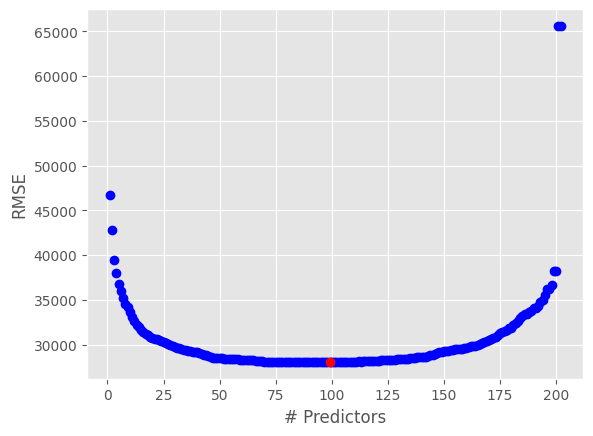

In [9]:
#As per the below graph we can observe that 100 can be considered as the optimal number of predictors to train the model to its best
plt.plot(models['p'],models['RMSE'],'ob')
plt.xlabel('# Predictors')
plt.ylabel('RMSE')
plt.plot(models['p'][models['RMSE'].idxmin()], models['RMSE'].min(), 'or')

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=3)

def processSubset(feature_set, X_train, y_train, X_test, y_test):
    model = sm.OLS(y_train,X_train[list(feature_set)])
    regr = model.fit()
    # RSS = ((regr.predict(X_test[list(feature_set)]) - y_test) ** 2).sum()
    RSS = np.sqrt(mean_squared_error(y_test, regr.predict(X_test[list(feature_set)])))
    RSSt = np.sqrt(mean_squared_error(y_train, regr.predict(X_train[list(feature_set)])))
    return {'features':feature_set, 'model':regr, 'RMSE_validation':RSS, 'RMSE_train':RSSt}

def forward(predictors, X_train, y_train, X_test, y_test):
    remaining_predictors = [p for p in X_train.columns if p not in predictors]
    results = []
    for p in remaining_predictors:
        results.append(processSubset(predictors+[p], X_train, y_train, X_test, y_test))
    models = pd.DataFrame(results)
    print("----Models:\n----", models['features'],models['RMSE_validation'],models['RMSE_train'])
    best_model = models.loc[models['RMSE_validation'].argmin()]
    return best_model

models_train = pd.DataFrame(columns=['RMSE_validation', 'model','RMSE_train'])

predictors = []

for i in range(1,len(X.columns)+1):
    print(i)
    models_train.loc[i] = forward(predictors, X_train, y_train, X_test, y_test)
    predictors = models_train.loc[i]['model'].model.exog_names

models_train['RMSE_validation'] = pd.to_numeric(models_train['RMSE_validation'])
models_train['RMSE_train'] = pd.to_numeric(models_train['RMSE_train'])

Streaming output truncated to the last 5000 lines.
14    23513.292146
15    23514.795441
16    23283.834349
17    23555.607914
18    23340.163440
19    23111.869046
20    23469.238268
21    23590.894311
22    22903.792336
23    23457.268748
24    23520.616148
25    23607.518255
26    23498.176445
27    23607.309963
28    23376.837728
29    23471.197320
30    23612.751951
31    23032.482181
32    23422.624381
33    23609.980587
34    23436.565618
35    23462.642928
36    21935.455983
37    22305.673429
38    23571.406677
39    23559.070770
40    23528.348396
41    23543.633128
42    23559.542574
43    23547.759579
44    23568.847586
45    23235.578487
46    23584.370094
47    22914.544857
48    23569.463005
49    23578.579027
50    23264.585852
51    23082.617258
52    22929.372274
53    22714.032581
54    23171.750635
55    23355.541103
56    22734.190229
Name: RMSE_train, dtype: float64
147
----Models:
---- 0     [OverallQual, GarageCars, LandSlope, KitchenQu...
1     [OverallQual, Ga

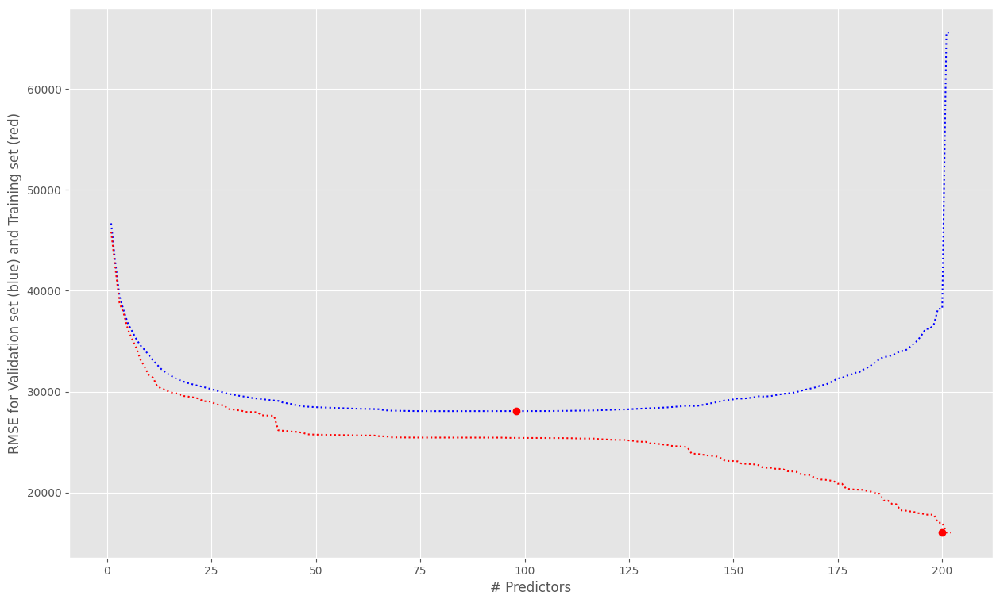

In [32]:
plt.figure(figsize=(15, 9))
plt.plot(models_train['RMSE_validation'],':b')
plt.plot(models_train['RMSE_train'],':r')
plt.xlabel('# Predictors')
plt.ylabel('RMSE for Validation set (blue) and Training set (red)')
plt.plot(models_train['RMSE_validation'].argmin(), models_train['RMSE_validation'].min(), 'or')
plt.plot(models_train['RMSE_train'].argmin(), models_train['RMSE_train'].min(), 'or')

As more number of predictors are being considered we can observe the following:
* Rmse score for the training set is decreasing
* Rmse score of validation decreases and then increases from midway after a stable error rate for few iterations.
* When 200 predictors are considered we can check that the error rate of testing error is significantly higher than that of testing error which clearly signifies the existence of an overfit model.



#FINAL RESULT CONSIDERATION

After evaluating the encoded dataset with all the forms type of feature selection, engineering and modelling we can conclude the following things:

|  Test No |  Technique Consideration | RMSE |
|----------|----------|----------|
| 1| Linear Regression   | 23483  |
| **2**| **Ridge Regression for α = 0.01**    | **23371**   |
| 3| Forward Subset Selection   | 27039  |
| 4| Cross Validation   | 22891   |

FINAL MODEL : RIDGE REGRESSION with α = 0.01 and cross validation.

NOTE
For Random Forest and Forward Subset Selection Ridge regression is considered as the model for output prediction.

### RMSE SCORE : 22891




In [ ]:
def final_result():
  return [214944, 158067, 127370, 128351, 132651, 272748, 63113, 188440, 141974, 156563, 145587, 285902, 256616, 169213, 168018, 416888, 116321, 167980, 224420, 61617, 109248, 188005, 159320, 185774, 127893, 109870, 191425, 181841, 185506, 119765, 129185, 143910, 318166, 253882, 171868, 168000, 124503, 154053, 223698, 210668, 164078, 169545, 196745, 117689, 116210, 106423, 131346, 222204, 292842, 183805, 292863, 158280, 126330, 206820, 163059, 183630, 107527, 198833, 125786, 141000, 109678, 95471, 149322, 129490, 219823, 252861, 189145, 225485, 286399, 96085, 220662, 249392, 84499, 244276, 189873, 212692, 101300, 196005, 136840, 157871, 139694, 183448, 245288, 255282, 128215, 269045, 247450, 138537, 293207, 168067, 167644, 188627, 344207, 150899, 140158, 76737, 118665, 214783, 147523, 60647, 208738, 154885, 316499, 165128, 123959, 106155, 197784, 136475, 259071, 343198, 223695, 210859, 75267, 151262, 101918, 141272, 152315, 211983, 269703, 290849, 250533, 219115, 317548, 145234, 106211, 215965, 194049, 131404, 191361, 122766, 206310, 172814, 242769, 167834, 125395, 178485, 192288, 147908, 366923, 133896, 76167, 186588, 162826, 369217, 166276, 124186, 214602, 147738, 297462, 148723, 231835, 161996, 141289, 178385, 129317, 391400, 248487, 147866, 399208, 119735, 257837, 199461, 130101, 188562, 134218, 136653, 283705, 99658, 110562, 188648, 122249, 284211, 149776, 137092, 105000, 145668, 260111, 112333, 253589, 88939, 384046, 139826, 147142, 102104, 214030, 130104, 122844, 142019, 119943, 134425, 239119, 321127, 170627, 153971, 164781, 60672, 204975, 348718, 194988, 155109, 192229, 123371, 147067, 318462, 107106, 227412, 151637, 152482, 295251, 101806, 141528, 129282, 103992, 296875, 143409, 219349, 239147, 93530, 62841, 128317, 144097, 189156, 262231, 144420, 284109, 201240, 143391, 153202, 226122, 166534, 115555, 270794, 209286, 137931, 132146, 158419, 185033, 150628, 234208, 148764, 277474, 200473, 170422, 147412, 95861, 188926, 236886, 160059, 60667, 206996, 165686, 193604, 162043, 138571, 142948, 155189, 182145, 144971, 139535, 148446, 102206, 180088, 125112, 311548, 215184, 133441, 154394, 134875, 151602, 154052, 165173, 96963, 150014, 120167, 252718, 129663, 122222, 174687, 201876, 166682, 171961, 203269, 232066, 282165, 105360, 198508, 274728, 152722, 119366, 229229, 142879, 137026, 178850, 68057, 95179, 196111, 239949, 223621, 184533, 170207, 147443, 223553, 114254, 177900, 168676, 156791, 313452, 124182, 306687, 231657, 75878, 247906, 367537, 151278, 142240, 210398, 168268, 244257, 162401, 230708, 68707, 195805, 96224, 117357, 111199, 162932, 162715, 202784, 162124, 161704, 168861, 146475, 120270, 41464, 106566, 321121, 140183, 202154, 143514, 239615, 71112, 167254, 212471, 145705, 150655, 237873, 341965, 157478, 129995, 229107, 179753, 229255, 116841, 133436, 145093, 191563, 160995, 174426, 165859, 242142, 124228, 81829, 197255, 277136, 212181, 301569, 149512, 212286, 162943, 138066, 170257, 153796, 164528, 172342, 115051, 209365, 271516, 218014, 140842, 126523, 264841, 166591, 230623, 186280, 177570, 61755, 162509, 132252, 123878, 153388, 312232, 322862, 224045, 157528, 187817, 226897, 110864, 195008, 259671, 86911, 68622, 254744, 130071, 132218, 121816, 228701, 201732, 265089, 244902, 219986, 370663, 196974, 163873, 156134, 190922, 122628, 242495, 184496, 252075, 96853, 72180, 102614, 310349, 107985, 157116, 136802, 186566, 216638, 277751, 109617, 116280, 324720, 208838, 119654, 200133, 186366, 365590, 304510, 97767, 91378, 275484, 166574, 201892, 263994, 147900, 152532]

